In [2]:
import math
import os
os.sys.path.append("./")
import re
from typing import Union

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import spatial, stats
from tqdm import tqdm 
from scipy.io import mmread
import scanpy as sc

In [64]:
os.sys.path.append("../../ecospatial")
from ecospatial import calculate_diversity_index, diversity_heatmap

ModuleNotFoundError: No module named 'ecospatial'

In [109]:
df = pd.read_csv('protein_birch_0607.csv')
df['cluster_composition_birch'] = df['cluster_composition_birch'].astype('category')
df['cluster_protein_birch'] = df['cluster_protein_birch'].astype('category')
df['cluster_rna_birch'] = df['cluster_rna_birch'].astype('category')
df

,Unnamed: 0.1,Unnamed: 0,cellLabelInImage,cellSize,HOECHST1,CD38,CD19,CD31,Vimentin,CD22,...,Ecadherin,PointNum,cluster.term,seurat_res1.0,centroid_x,centroid_y,step,cluster_composition_birch,cluster_protein_birch,cluster_rna_birch
0,0,8142,1,51,6267.294118,0.143310,0.614983,0.016350,0.299605,1.000000,...,0.178581,reg001_X02_Y07_Z09,B-CD22-CD40,8,1.725490,510.843137,0,0,3,5
1,1,8143,2,53,6805.830189,0.069681,1.000000,0.153656,1.000000,0.718178,...,0.342726,reg001_X02_Y07_Z09,B-CD22-CD40,7,1.754717,881.490566,0,0,6,1
2,2,8144,3,57,4889.789474,0.438127,1.000000,0.044091,0.273363,0.443502,...,0.340269,reg001_X02_Y07_Z09,B-Ki67,6,1.964912,1287.526316,0,9,0,3
3,3,8147,6,56,4450.660714,0.000000,1.000000,0.050185,0.274332,1.000000,...,0.082396,reg001_X02_Y07_Z09,B-CD22-CD40,0,1.910714,660.875000,0,0,6,1
4,4,8148,7,79,8951.000000,0.114900,0.412287,0.039873,0.418782,0.769603,...,0.166426,reg001_X02_Y07_Z09,B-CD22-CD40,4,2.291139,851.860759,0,0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178914,178914,307664,4081,46,4188.065217,0.000000,0.516711,0.079410,0.000000,0.904165,...,0.000000,reg001_X08_Y15_Z06,B-CD22-CD40,0,9069.152174,8730.326087,0,3,6,9
178915,178915,307665,4082,65,4169.923077,0.210978,0.034039,0.010116,0.024256,0.000000,...,0.106543,reg001_X08_Y15_Z06,CD4 T,1,9069.292308,8789.384615,0,0,6,1
178916,178916,307666,4083,75,9355.746667,0.086992,0.020658,0.005740,0.334716,0.000000,...,0.230460,reg001_X08_Y15_Z06,CD4 T,1,9068.853333,9216.053333,0,0,3,5
178917,178917,307667,4084,77,7284.675325,0.143877,0.785678,0.138733,0.184268,1.000000,...,0.316185,reg001_X08_Y15_Z06,B-CD22-CD40,0,9068.948052,8273.857143,13,0,4,1


# Birch
## Cellular composition

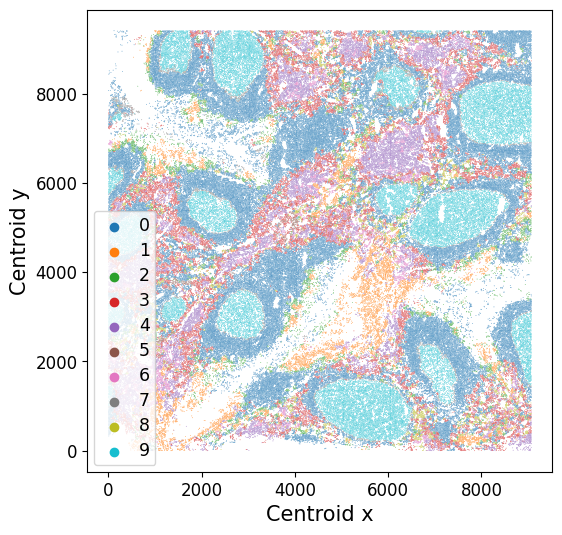

In [110]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_birch", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [111]:
df['cluster_composition_birch_order'] = df['cluster_composition_birch']
index1 = df[df['cluster_composition_birch_order'] == 1].index
index2 = df[df['cluster_composition_birch_order'] == 9].index
df.loc[index2, 'cluster_composition_birch_order'] = 1
df.loc[index1, 'cluster_composition_birch_order'] = 9

index3 = df[df['cluster_composition_birch_order'] == 8].index
index4 = df[df['cluster_composition_birch_order'] == 4].index
df.loc[index3, 'cluster_composition_birch_order'] = 4
df.loc[index4, 'cluster_composition_birch_order'] = 8

# swap 0 and 9
index5 = df[df['cluster_composition_birch_order'] == 0].index
index6 = df[df['cluster_composition_birch_order'] == 9].index
df.loc[index5, 'cluster_composition_birch_order'] = 9
df.loc[index6, 'cluster_composition_birch_order'] = 0

# swap 5 and 0
index7 = df[df['cluster_composition_birch_order'] == 5].index
index8 = df[df['cluster_composition_birch_order'] == 0].index
df.loc[index7, 'cluster_composition_birch_order'] = 0
df.loc[index8, 'cluster_composition_birch_order'] = 5

# swap 4 and 3
index9 = df[df['cluster_composition_birch_order'] == 4].index
index10 = df[df['cluster_composition_birch_order'] == 3].index
df.loc[index9, 'cluster_composition_birch_order'] = 3
df.loc[index10, 'cluster_composition_birch_order'] = 4

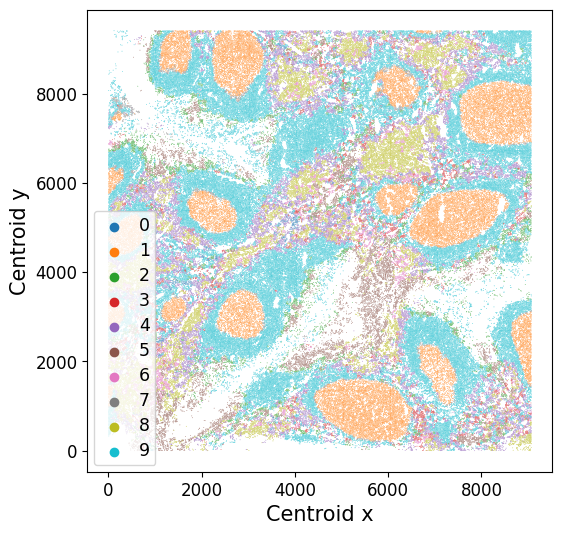

In [64]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_birch_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
#plt.show()

plt.savefig('figures_clustering/cell_birch.png')
plt.savefig('figures_clustering/cell_birch.svg', dpi=300)
plt.show()

## Protein

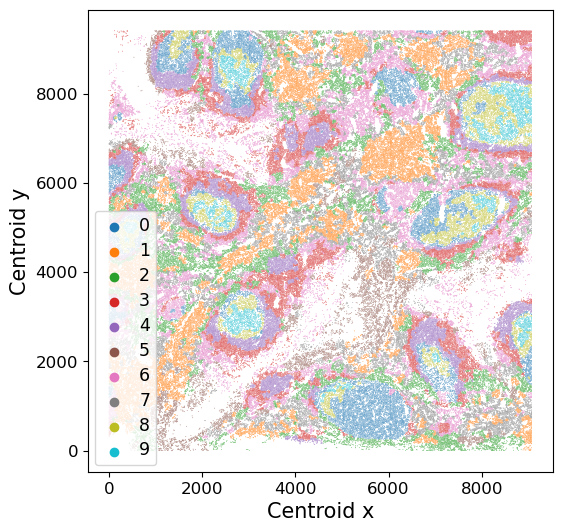

In [4]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_birch", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [112]:
df['cluster_protein_birch_order'] = df['cluster_protein_birch']
# swap 1 and 9
index1 = df[df['cluster_protein_birch_order'] == 1].index
index2 = df[df['cluster_protein_birch_order'] == 9].index
df.loc[index1, 'cluster_protein_birch_order'] = 9
df.loc[index2, 'cluster_protein_birch_order'] = 1

# swap 3 and 8
index3 = df[df['cluster_protein_birch_order'] == 3].index
index4 = df[df['cluster_protein_birch_order'] == 8].index
df.loc[index3, 'cluster_protein_birch_order'] = 8
df.loc[index4, 'cluster_protein_birch_order'] = 3

# swap 8 and 9
index5 = df[df['cluster_protein_birch_order'] == 8].index
index6 = df[df['cluster_protein_birch_order'] == 9].index
df.loc[index5, 'cluster_protein_birch_order'] = 9
df.loc[index6, 'cluster_protein_birch_order'] = 8

# swap 2 and 5
index7 = df[df['cluster_protein_birch_order'] == 2].index
index8 = df[df['cluster_protein_birch_order'] == 5].index
df.loc[index7, 'cluster_protein_birch_order'] = 5
df.loc[index8, 'cluster_protein_birch_order'] = 2

# swap 4 and 2
index9 = df[df['cluster_protein_birch_order'] == 4].index
index10 = df[df['cluster_protein_birch_order'] == 2].index
df.loc[index9, 'cluster_protein_birch_order'] = 2
df.loc[index10, 'cluster_protein_birch_order'] = 4

# swap 4 and 7
index11 = df[df['cluster_protein_birch_order'] == 4].index
index12 = df[df['cluster_protein_birch_order'] == 7].index
df.loc[index11, 'cluster_protein_birch_order'] = 7
df.loc[index12, 'cluster_protein_birch_order'] = 4

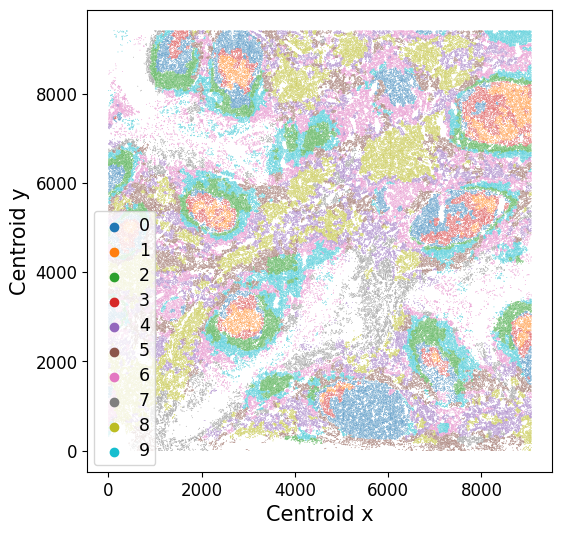

In [113]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_birch_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/protein_birch.png')
plt.savefig('figures_clustering/protein_birch.svg', dpi=300)
plt.show()

## RNA

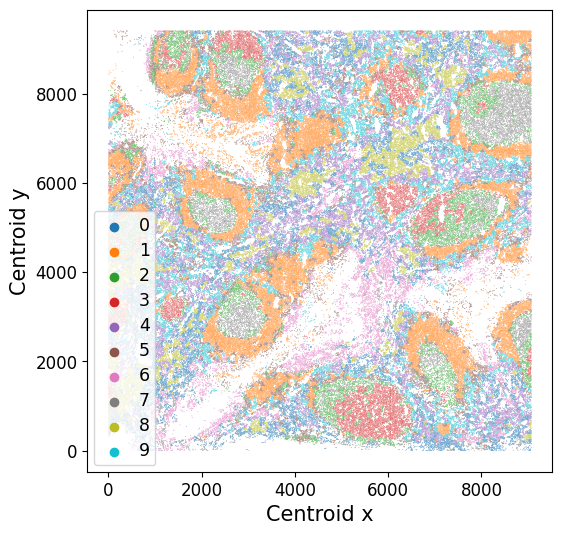

In [37]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_birch", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [114]:
df['cluster_rna_birch_order'] = df['cluster_rna_birch']
# swap 1 and 7
index1 = df[df['cluster_rna_birch_order'] == 1].index
index2 = df[df['cluster_rna_birch_order'] == 7].index
df.loc[index1, 'cluster_rna_birch_order'] = 7
df.loc[index2, 'cluster_rna_birch_order'] = 1

# swap 3 and 0
index3 = df[df['cluster_rna_birch_order'] == 3].index
index4 = df[df['cluster_rna_birch_order'] == 0].index
df.loc[index3, 'cluster_rna_birch_order'] = 0
df.loc[index4, 'cluster_rna_birch_order'] = 3

# swap 2 and 3
index5 = df[df['cluster_rna_birch_order'] == 2].index
index6 = df[df['cluster_rna_birch_order'] == 3].index
df.loc[index5, 'cluster_rna_birch_order'] = 3
df.loc[index6, 'cluster_rna_birch_order'] = 2

# swap 2 and 7
index7 = df[df['cluster_rna_birch_order'] == 2].index
index8 = df[df['cluster_rna_birch_order'] == 7].index
df.loc[index7, 'cluster_rna_birch_order'] = 7
df.loc[index8, 'cluster_rna_birch_order'] = 2

# swap 5 and 6
index11 = df[df['cluster_rna_birch_order'] == 5].index
index12 = df[df['cluster_rna_birch_order'] == 6].index
df.loc[index11, 'cluster_rna_birch_order'] = 6
df.loc[index12, 'cluster_rna_birch_order'] = 5

# swap 4 and 6
index13 = df[df['cluster_rna_birch_order'] == 4].index
index14 = df[df['cluster_rna_birch_order'] == 6].index
df.loc[index13, 'cluster_rna_birch_order'] = 6
df.loc[index14, 'cluster_rna_birch_order'] = 4

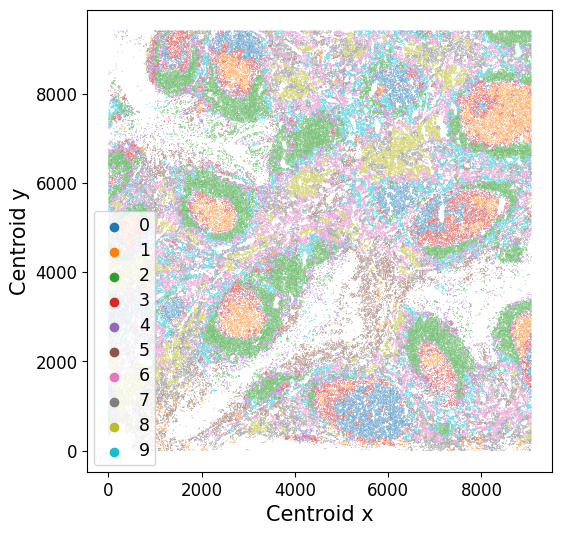

In [115]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_birch_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/rna_birch.png')
plt.savefig('figures_clustering/rna_birch.svg', dpi=300)
plt.show()

In [118]:
protein_region = df
protein_patch = protein_region[
                (protein_region["centroid_x"] >= 1500) &#example_patch[0]) &
                (protein_region["centroid_x"] < 3700) & #example_patch[2]) &
                (protein_region["centroid_y"] >= 7200) &#example_patch[1]) &
                (protein_region["centroid_y"] < 9400) #example_patch[3])
            ]

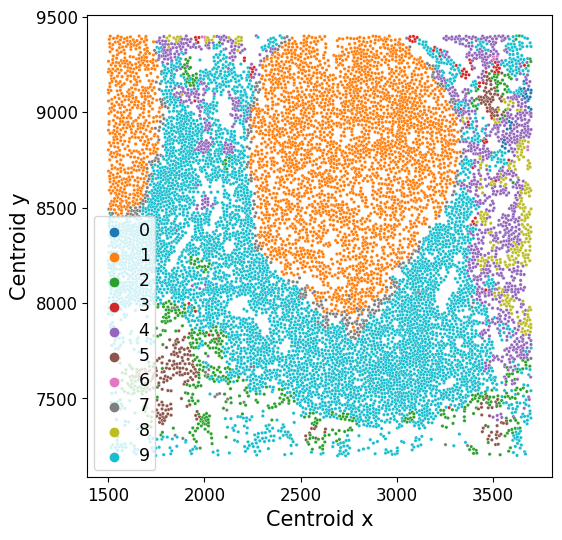

In [120]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_birch_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/cell_birch_patch.png')
plt.savefig('figures_clustering/cell_birch_patch.svg', dpi=300)
plt.show()

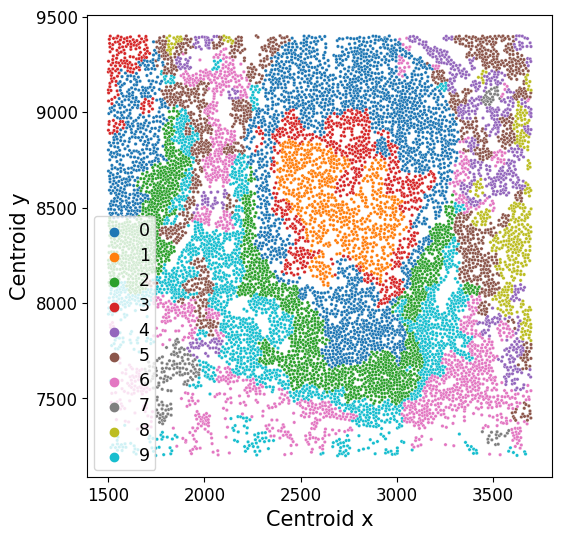

In [122]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_birch_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/protein_birch_patch.png')
plt.savefig('figures_clustering/protein_birch_patch.svg', dpi=300)
plt.show()

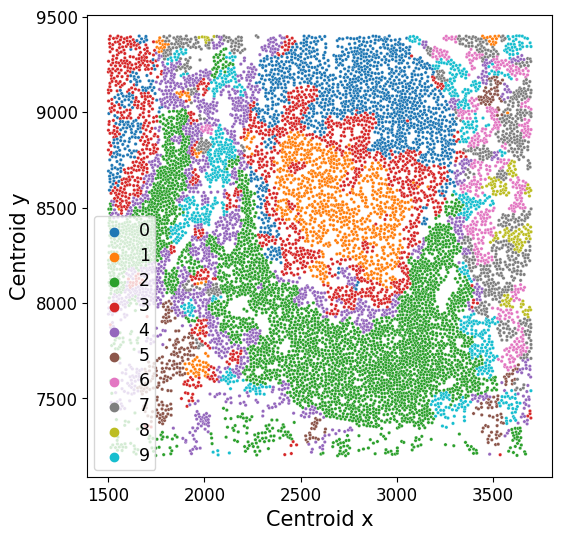

In [123]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_birch_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/rna_birch_patch.png')
plt.savefig('figures_clustering/rna_birch_patch.svg', dpi=300)
plt.show()

In [141]:
df['reg'] = '1'
custom_patch = [(1500,7200,3700,9400)]

In [146]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster.term', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[1.80775838]]


In [148]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_composition_birch', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[1.99675073]]


In [149]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_protein_birch', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[3.03742527]]


In [150]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_rna_birch', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[2.85957718]]


# HClust
## Cellular composition

In [151]:
df = pd.read_csv('protein_hclust_0607.csv')
df['cluster_composition_hc'] = df['cluster_composition_hc'].astype('category')
df['cluster_protein_hc'] = df['cluster_protein_hc'].astype('category')
df['cluster_rna_hc'] = df['cluster_rna_hc'].astype('category')
df

,Unnamed: 0.1,Unnamed: 0,cellLabelInImage,cellSize,HOECHST1,CD38,CD19,CD31,Vimentin,CD22,...,PointNum,cluster.term,seurat_res1.0,centroid_x,centroid_y,step,cluster_composition_hc,cluster_protein_hc,cluster_rna_hc,cluster_comb_hc
0,0,8142,1,51,6267.294118,0.143310,0.614983,0.016350,0.299605,1.000000,...,reg001_X02_Y07_Z09,B-CD22-CD40,8,1.725490,510.843137,0,1,8,7,7
1,1,8143,2,53,6805.830189,0.069681,1.000000,0.153656,1.000000,0.718178,...,reg001_X02_Y07_Z09,B-CD22-CD40,7,1.754717,881.490566,0,1,8,7,7
2,2,8144,3,57,4889.789474,0.438127,1.000000,0.044091,0.273363,0.443502,...,reg001_X02_Y07_Z09,B-Ki67,6,1.964912,1287.526316,0,2,5,9,9
3,3,8147,6,56,4450.660714,0.000000,1.000000,0.050185,0.274332,1.000000,...,reg001_X02_Y07_Z09,B-CD22-CD40,0,1.910714,660.875000,0,1,8,7,3
4,4,8148,7,79,8951.000000,0.114900,0.412287,0.039873,0.418782,0.769603,...,reg001_X02_Y07_Z09,B-CD22-CD40,4,2.291139,851.860759,0,1,8,7,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178914,178914,307664,4081,46,4188.065217,0.000000,0.516711,0.079410,0.000000,0.904165,...,reg001_X08_Y15_Z06,B-CD22-CD40,0,9069.152174,8730.326087,0,1,8,7,3
178915,178915,307665,4082,65,4169.923077,0.210978,0.034039,0.010116,0.024256,0.000000,...,reg001_X08_Y15_Z06,CD4 T,1,9069.292308,8789.384615,0,1,8,7,7
178916,178916,307666,4083,75,9355.746667,0.086992,0.020658,0.005740,0.334716,0.000000,...,reg001_X08_Y15_Z06,CD4 T,1,9068.853333,9216.053333,0,1,1,7,7
178917,178917,307667,4084,77,7284.675325,0.143877,0.785678,0.138733,0.184268,1.000000,...,reg001_X08_Y15_Z06,B-CD22-CD40,0,9068.948052,8273.857143,13,1,8,7,7


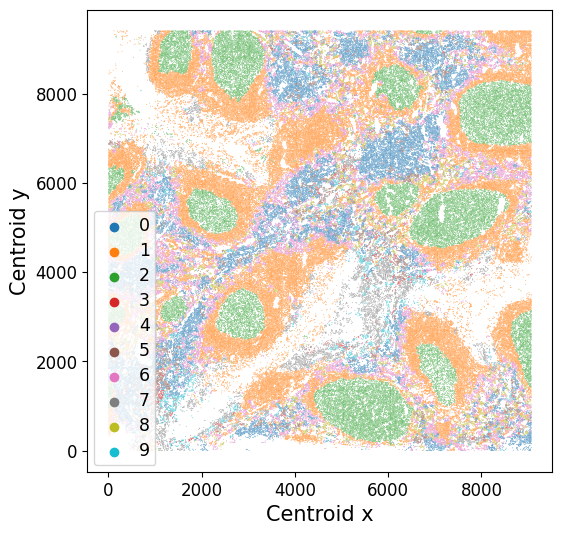

In [152]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_hc", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [153]:
df['cluster_composition_hc_order'] = df['cluster_composition_hc']
# swap 2 and 1
index1 = df[df['cluster_composition_hc_order'] == 2].index
index2 = df[df['cluster_composition_hc_order'] == 1].index
df.loc[index1, 'cluster_composition_hc_order'] = 1
df.loc[index2, 'cluster_composition_hc_order'] = 2

# swap 2 and 9
index3 = df[df['cluster_composition_hc_order'] == 2].index
index4 = df[df['cluster_composition_hc_order'] == 9].index
df.loc[index3, 'cluster_composition_hc_order'] = 9
df.loc[index4, 'cluster_composition_hc_order'] = 2

# swap 8 and 0
index5 = df[df['cluster_composition_hc_order'] == 8].index
index6 = df[df['cluster_composition_hc_order'] == 0].index
df.loc[index5, 'cluster_composition_hc_order'] = 0
df.loc[index6, 'cluster_composition_hc_order'] = 8

# swap 4 and 6
index7 = df[df['cluster_composition_hc_order'] == 4].index
index8 = df[df['cluster_composition_hc_order'] == 6].index
df.loc[index7, 'cluster_composition_hc_order'] = 6
df.loc[index8, 'cluster_composition_hc_order'] = 4

# swap 7 and 5
index9 = df[df['cluster_composition_hc_order'] == 7].index
index10 = df[df['cluster_composition_hc_order'] == 5].index
df.loc[index9, 'cluster_composition_hc_order'] = 5
df.loc[index10, 'cluster_composition_hc_order'] = 7

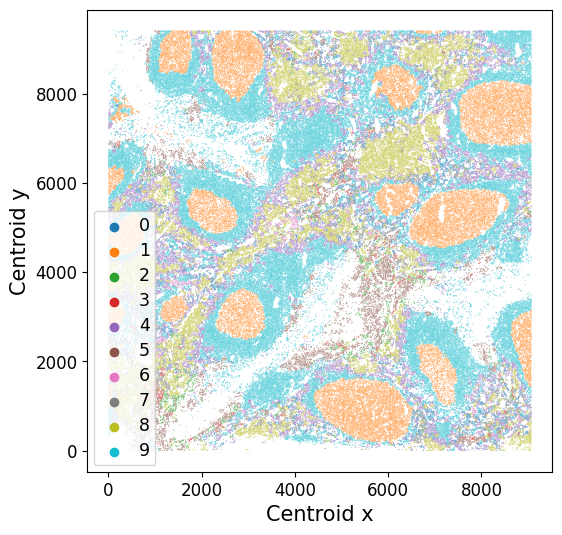

In [154]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_hc_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/cell_hclust.png')
plt.savefig('figures_clustering/cell_hclust.svg', dpi=300)
plt.show()

## Protein

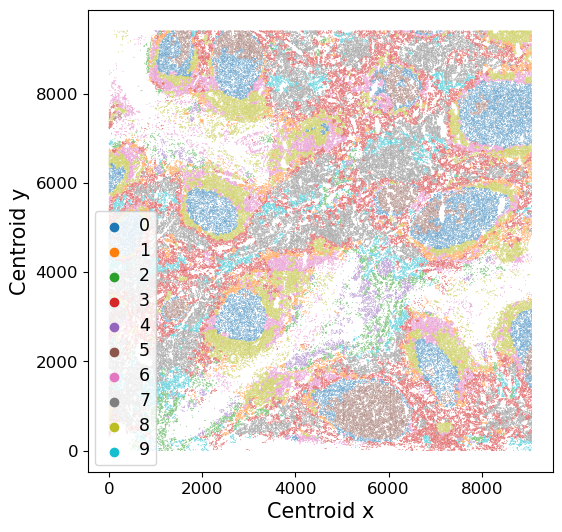

In [12]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_hc", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [155]:
df['cluster_protein_hc_order'] = df['cluster_protein_hc']
# swap 0 and 1
index1 = df[df['cluster_protein_hc_order'] == 0].index
index2 = df[df['cluster_protein_hc_order'] == 1].index
df.loc[index1, 'cluster_protein_hc_order'] = 1
df.loc[index2, 'cluster_protein_hc_order'] = 0

# swap 0 and 5
index3 = df[df['cluster_protein_hc_order'] == 0].index
index4 = df[df['cluster_protein_hc_order'] == 5].index
df.loc[index3, 'cluster_protein_hc_order'] = 5
df.loc[index4, 'cluster_protein_hc_order'] = 0

# swap 7 and 8
index5 = df[df['cluster_protein_hc_order'] == 7].index
index6 = df[df['cluster_protein_hc_order'] == 8].index
df.loc[index5, 'cluster_protein_hc_order'] = 8
df.loc[index6, 'cluster_protein_hc_order'] = 7

# swap 7 and 9
index7 = df[df['cluster_protein_hc_order'] == 7].index
index8 = df[df['cluster_protein_hc_order'] == 9].index
df.loc[index7, 'cluster_protein_hc_order'] = 9
df.loc[index8, 'cluster_protein_hc_order'] = 7

# swap 3 and 6
index9 = df[df['cluster_protein_hc_order'] == 3].index
index10 = df[df['cluster_protein_hc_order'] == 6].index
df.loc[index9, 'cluster_protein_hc_order'] = 6
df.loc[index10, 'cluster_protein_hc_order'] = 3

# swap 7 and 2
index11 = df[df['cluster_protein_hc_order'] == 7].index
index12 = df[df['cluster_protein_hc_order'] == 2].index
df.loc[index11, 'cluster_protein_hc_order'] = 2
df.loc[index12, 'cluster_protein_hc_order'] = 7

# swap 2 and 5
index13 = df[df['cluster_protein_hc_order'] == 2].index
index14 = df[df['cluster_protein_hc_order'] == 5].index
df.loc[index13, 'cluster_protein_hc_order'] = 5
df.loc[index14, 'cluster_protein_hc_order'] = 2

# swap 2 and 3
index15 = df[df['cluster_protein_hc_order'] == 2].index
index16 = df[df['cluster_protein_hc_order'] == 3].index
df.loc[index15, 'cluster_protein_hc_order'] = 3
df.loc[index16, 'cluster_protein_hc_order'] = 2

# swap 7 and 4
index17 = df[df['cluster_protein_hc_order'] == 7].index
index18 = df[df['cluster_protein_hc_order'] == 4].index
df.loc[index17, 'cluster_protein_hc_order'] = 4
df.loc[index18, 'cluster_protein_hc_order'] = 7

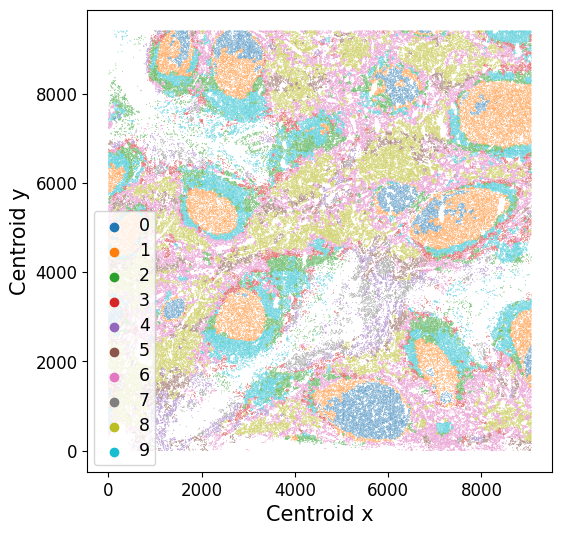

In [156]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_hc_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/protein_hclust.png')
plt.savefig('figures_clustering/protein_hclust.svg', dpi=300)
plt.show()

## RNA

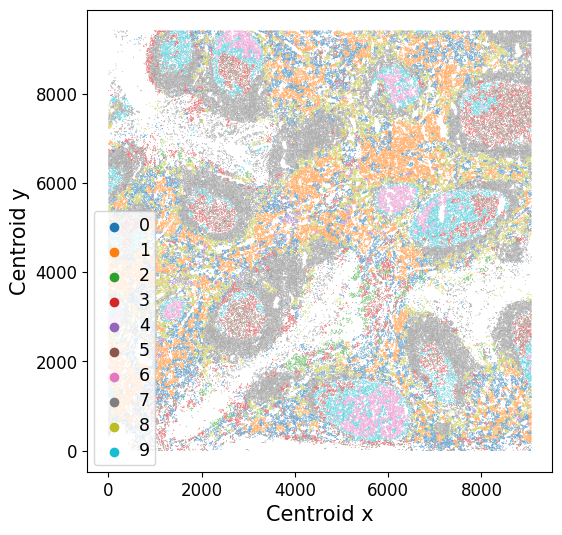

In [89]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_hc", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [157]:
df['cluster_rna_hc_order'] = df['cluster_rna_hc']
# swap 6 and 0
index1 = df[df['cluster_rna_hc_order'] == 6].index
index2 = df[df['cluster_rna_hc_order'] == 0].index
df.loc[index1, 'cluster_rna_hc_order'] = 0
df.loc[index2, 'cluster_rna_hc_order'] = 6

# swap 5 and 1
index3 = df[df['cluster_rna_hc_order'] == 5].index
index4 = df[df['cluster_rna_hc_order'] == 1].index
df.loc[index3, 'cluster_rna_hc_order'] = 1
df.loc[index4, 'cluster_rna_hc_order'] = 5

# swap 3 and 9
index5 = df[df['cluster_rna_hc_order'] == 3].index
index6 = df[df['cluster_rna_hc_order'] == 9].index
df.loc[index5, 'cluster_rna_hc_order'] = 9
df.loc[index6, 'cluster_rna_hc_order'] = 3

# swap 7 and 9
index7 = df[df['cluster_rna_hc_order'] == 7].index
index8 = df[df['cluster_rna_hc_order'] == 9].index
df.loc[index7, 'cluster_rna_hc_order'] = 9
df.loc[index8, 'cluster_rna_hc_order'] = 7

# swap 2 and 7
index9 = df[df['cluster_rna_hc_order'] == 2].index
index10 = df[df['cluster_rna_hc_order'] == 7].index
df.loc[index9, 'cluster_rna_hc_order'] = 7
df.loc[index10, 'cluster_rna_hc_order'] = 2

# swap 6 and 8
index11 = df[df['cluster_rna_hc_order'] == 6].index
index12 = df[df['cluster_rna_hc_order'] == 8].index
df.loc[index11, 'cluster_rna_hc_order'] = 8
df.loc[index12, 'cluster_rna_hc_order'] = 6

# swap 5 and 8
index13 = df[df['cluster_rna_hc_order'] == 5].index
index14 = df[df['cluster_rna_hc_order'] == 8].index
df.loc[index13, 'cluster_rna_hc_order'] = 8
df.loc[index14, 'cluster_rna_hc_order'] = 5

# swap 2 and 7
index15 = df[df['cluster_rna_hc_order'] == 2].index
index16 = df[df['cluster_rna_hc_order'] == 7].index
df.loc[index15, 'cluster_rna_hc_order'] = 7
df.loc[index16, 'cluster_rna_hc_order'] = 2


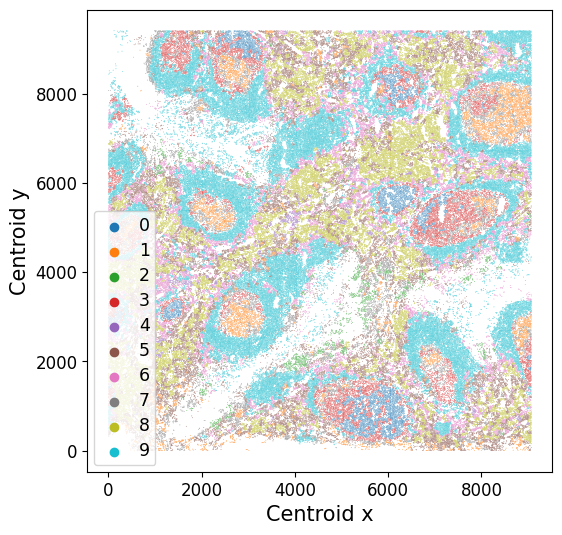

In [158]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_hc_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.savefig('figures_clustering/rna_hclust.png')
plt.savefig('figures_clustering/rna_hclust.svg', dpi=300)
plt.show()

In [159]:
protein_region = df
protein_patch = protein_region[
                (protein_region["centroid_x"] >= 1500) &#example_patch[0]) &
                (protein_region["centroid_x"] < 3700) & #example_patch[2]) &
                (protein_region["centroid_y"] >= 7200) &#example_patch[1]) &
                (protein_region["centroid_y"] < 9400) #example_patch[3])
            ]

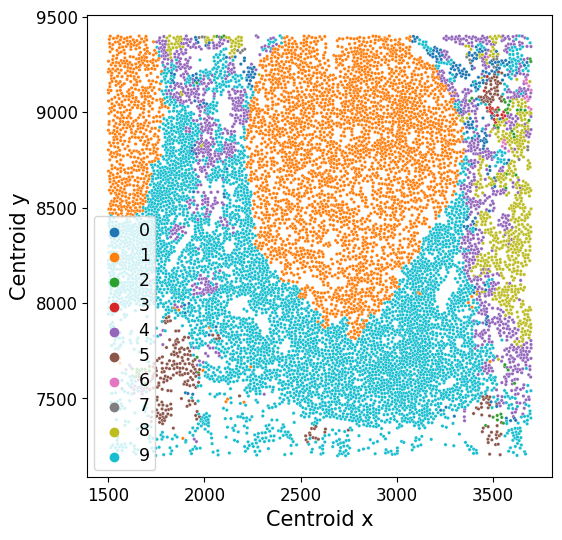

In [162]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_hc_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/cell_hc_patch.png')
plt.savefig('figures_clustering/cell_hc_patch.svg', dpi=300)
plt.show()

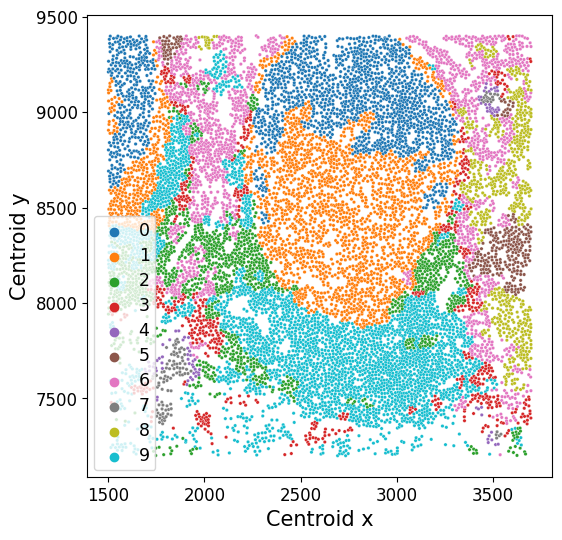

In [163]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_hc_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/protein_hc_patch.png')
plt.savefig('figures_clustering/protein_hc_patch.svg', dpi=300)
plt.show()

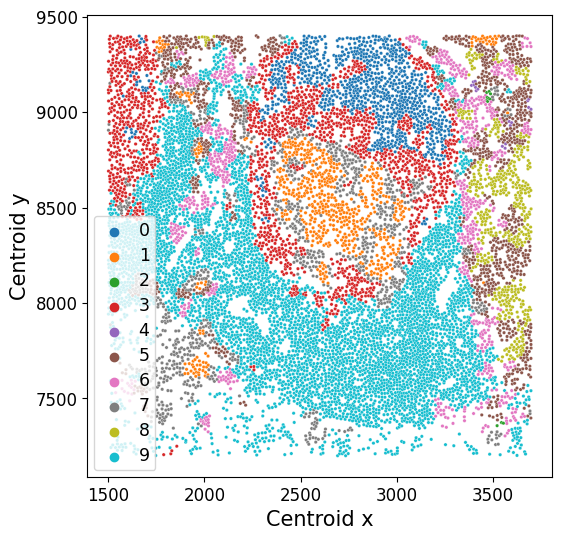

In [164]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_hc_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/rna_hc_patch.png')
plt.savefig('figures_clustering/rna_hc_patch.svg', dpi=300)
plt.show()

In [165]:
df['reg'] = '1'
custom_patch = [(1500,7200,3700,9400)]

In [166]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_composition_hc_order', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[1.90688516]]


In [167]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_protein_hc_order', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[2.81806691]]


In [168]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_rna_hc_order', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

0.000 per cent patches are empty
[[2.52390749]]


# FSOM

In [11]:
df = pd.read_csv('tonsil_clustering_fsom.csv')
index1 = df[df['cluster_composition_fsom'] == 10].index
index2 = df[df['cluster_protein_fsom'] == 10].index
index3 = df[df['cluster_rna_fsom'] == 10].index
df.loc[index1, 'cluster_composition_fsom'] = 0
df.loc[index2, 'cluster_protein_fsom'] = 0
df.loc[index3, 'cluster_rna_fsom'] = 0

In [12]:
df['cluster_composition_fsom'] = df['cluster_composition_fsom'].astype('category')
df['cluster_protein_fsom'] = df['cluster_protein_fsom'].astype('category')
df['cluster_rna_fsom'] = df['cluster_rna_fsom'].astype('category')
df

,X,Unnamed..0,cellLabelInImage,cellSize,HOECHST1,CD38,CD19,CD31,Vimentin,CD22,...,Ecadherin,PointNum,cluster.term,seurat_res1.0,centroid_x,centroid_y,step,cluster_composition_fsom,cluster_protein_fsom,cluster_rna_fsom
0,0,8142,1,51,6267.294118,0.143310,0.614983,0.016350,0.299605,1.000000,...,0.178581,reg001_X02_Y07_Z09,B-CD22-CD40,8,1.725490,510.843137,0,8,7,7
1,1,8143,2,53,6805.830189,0.069681,1.000000,0.153656,1.000000,0.718178,...,0.342726,reg001_X02_Y07_Z09,B-CD22-CD40,7,1.754717,881.490566,0,8,6,7
2,2,8144,3,57,4889.789474,0.438127,1.000000,0.044091,0.273363,0.443502,...,0.340269,reg001_X02_Y07_Z09,B-Ki67,6,1.964912,1287.526316,0,0,5,9
3,3,8147,6,56,4450.660714,0.000000,1.000000,0.050185,0.274332,1.000000,...,0.082396,reg001_X02_Y07_Z09,B-CD22-CD40,0,1.910714,660.875000,0,8,7,7
4,4,8148,7,79,8951.000000,0.114900,0.412287,0.039873,0.418782,0.769603,...,0.166426,reg001_X02_Y07_Z09,B-CD22-CD40,4,2.291139,851.860759,0,8,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178914,178914,307664,4081,46,4188.065217,0.000000,0.516711,0.079410,0.000000,0.904165,...,0.000000,reg001_X08_Y15_Z06,B-CD22-CD40,0,9069.152174,8730.326087,0,8,7,7
178915,178915,307665,4082,65,4169.923077,0.210978,0.034039,0.010116,0.024256,0.000000,...,0.106543,reg001_X08_Y15_Z06,CD4 T,1,9069.292308,8789.384615,0,8,7,7
178916,178916,307666,4083,75,9355.746667,0.086992,0.020658,0.005740,0.334716,0.000000,...,0.230460,reg001_X08_Y15_Z06,CD4 T,1,9068.853333,9216.053333,0,8,6,7
178917,178917,307667,4084,77,7284.675325,0.143877,0.785678,0.138733,0.184268,1.000000,...,0.316185,reg001_X08_Y15_Z06,B-CD22-CD40,0,9068.948052,8273.857143,13,8,6,7


# Cellular composition

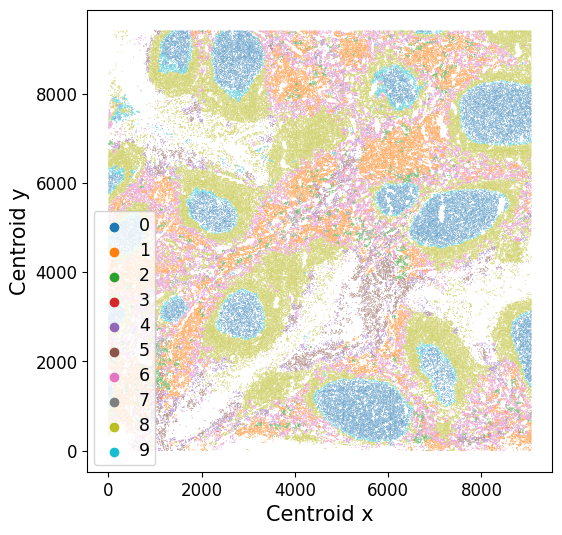

In [13]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_fsom", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [23]:
df['cluster_composition_fsom_order'] = df['cluster_composition_fsom']
# swap 0 and 1
index1 = df[df['cluster_composition_fsom_order'] == 0].index
index2 = df[df['cluster_composition_fsom_order'] == 1].index
df.loc[index1, 'cluster_composition_fsom_order'] = 1
df.loc[index2, 'cluster_composition_fsom_order'] = 0

# swap 8 and 9
index3 = df[df['cluster_composition_fsom_order'] == 8].index
index4 = df[df['cluster_composition_fsom_order'] == 9].index
df.loc[index3, 'cluster_composition_fsom_order'] = 9
df.loc[index4, 'cluster_composition_fsom_order'] = 8

# swap 0 and 8
index5 = df[df['cluster_composition_fsom_order'] == 0].index
index6 = df[df['cluster_composition_fsom_order'] == 8].index
df.loc[index5, 'cluster_composition_fsom_order'] = 8
df.loc[index6, 'cluster_composition_fsom_order'] = 0

# swap 4 and 6
index7 = df[df['cluster_composition_fsom_order'] == 4].index
index8 = df[df['cluster_composition_fsom_order'] == 6].index
df.loc[index7, 'cluster_composition_fsom_order'] = 6
df.loc[index8, 'cluster_composition_fsom_order'] = 4

# swap 0 and 7
index9 = df[df['cluster_composition_fsom_order'] == 0].index
index10 = df[df['cluster_composition_fsom_order'] == 7].index
df.loc[index9, 'cluster_composition_fsom_order'] = 7
df.loc[index10, 'cluster_composition_fsom_order'] = 0

# swap 2 and 6
index11 = df[df['cluster_composition_fsom_order'] == 2].index
index12 = df[df['cluster_composition_fsom_order'] == 6].index
df.loc[index11, 'cluster_composition_fsom_order'] = 6
df.loc[index12, 'cluster_composition_fsom_order'] = 2



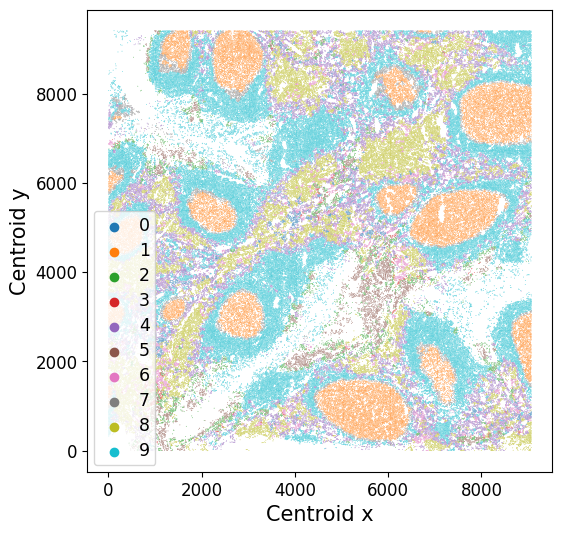

In [26]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_fsom_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/cell_fsom.png')
plt.savefig('figures_clustering/cell_fsom.svg', dpi=300)
plt.show()

# Protein

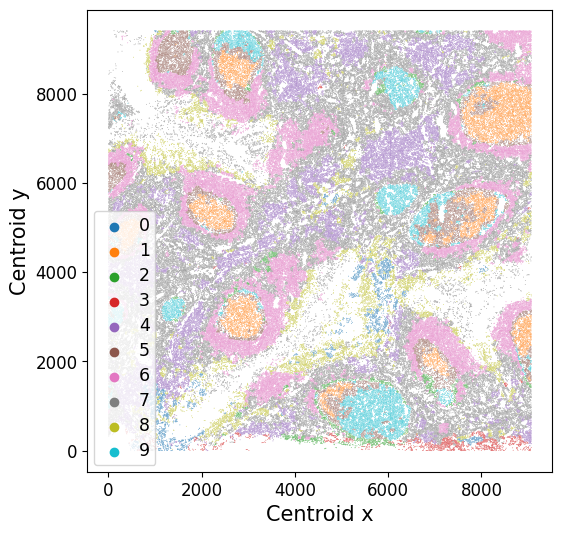

In [25]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_fsom", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [79]:
df['cluster_protein_fsom_order'] = df['cluster_protein_fsom']
# swap 3 and 5
index1 = df[df['cluster_protein_fsom_order'] == 3].index
index2 = df[df['cluster_protein_fsom_order'] == 5].index
df.loc[index1, 'cluster_protein_fsom_order'] = 5
df.loc[index2, 'cluster_protein_fsom_order'] = 3

# swap 9 and 0
index3 = df[df['cluster_protein_fsom_order'] == 9].index
index4 = df[df['cluster_protein_fsom_order'] == 0].index
df.loc[index3, 'cluster_protein_fsom_order'] = 0
df.loc[index4, 'cluster_protein_fsom_order'] = 9

# swap 6 and 9
index5 = df[df['cluster_protein_fsom_order'] == 6].index
index6 = df[df['cluster_protein_fsom_order'] == 9].index
df.loc[index5, 'cluster_protein_fsom_order'] = 9
df.loc[index6, 'cluster_protein_fsom_order'] = 6

# swap 4 and 8
index7 = df[df['cluster_protein_fsom_order'] == 4].index
index8 = df[df['cluster_protein_fsom_order'] == 8].index
df.loc[index7, 'cluster_protein_fsom_order'] = 8
df.loc[index8, 'cluster_protein_fsom_order'] = 4

# swap 6 and 7
index9 = df[df['cluster_protein_fsom_order'] == 6].index
index10 = df[df['cluster_protein_fsom_order'] == 7].index
df.loc[index9, 'cluster_protein_fsom_order'] = 7
df.loc[index10, 'cluster_protein_fsom_order'] = 6

# swap 4 and 5
index11 = df[df['cluster_protein_fsom_order'] == 4].index
index12 = df[df['cluster_protein_fsom_order'] == 5].index
df.loc[index11, 'cluster_protein_fsom_order'] = 5
df.loc[index12, 'cluster_protein_fsom_order'] = 4

# swap 2 and 9
index13 = df[df['cluster_protein_fsom_order'] == 2].index
index14 = df[df['cluster_protein_fsom_order'] == 9].index
df.loc[index13, 'cluster_protein_fsom_order'] = 9
df.loc[index14, 'cluster_protein_fsom_order'] = 2


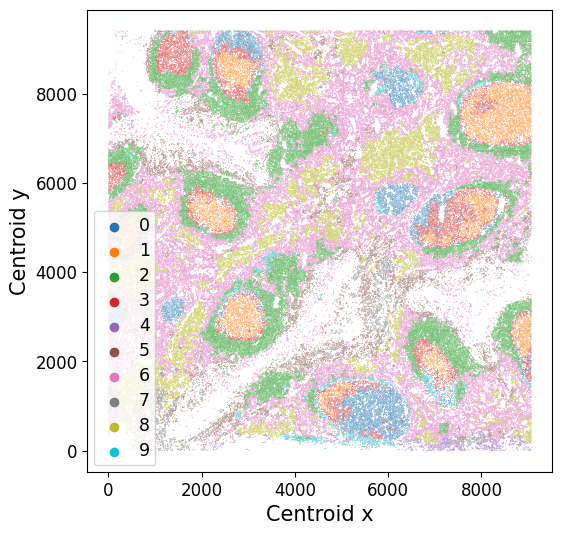

In [76]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_fsom_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.savefig('figures_clustering/protein_fsom.png')
plt.savefig('figures_clustering/protein_fsom.svg', dpi=300)
plt.show()

# RNA

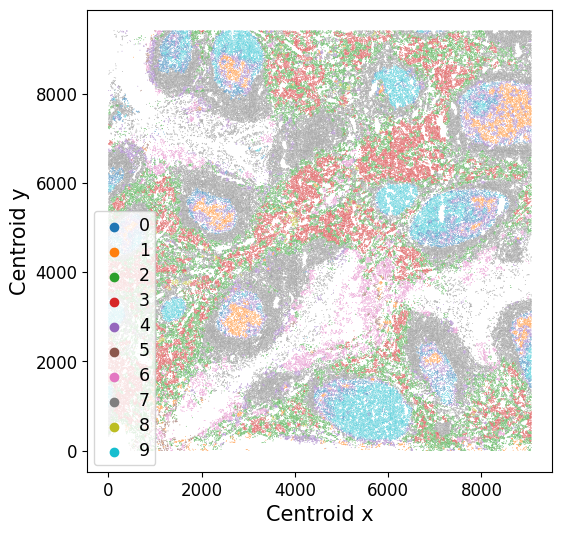

In [41]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_fsom", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.show()

In [73]:
df['cluster_rna_fsom_order'] = df['cluster_rna_fsom']
# swap 0 and 9
index1 = df[df['cluster_rna_fsom_order'] == 0].index
index2 = df[df['cluster_rna_fsom_order'] == 9].index
df.loc[index1, 'cluster_rna_fsom_order'] = 9
df.loc[index2, 'cluster_rna_fsom_order'] = 0

# swap 4 and 3
index3 = df[df['cluster_rna_fsom_order'] == 4].index
index4 = df[df['cluster_rna_fsom_order'] == 3].index
df.loc[index3, 'cluster_rna_fsom_order'] = 3
df.loc[index4, 'cluster_rna_fsom_order'] = 4

# swap 7 and 9
index5 = df[df['cluster_rna_fsom_order'] == 7].index
index6 = df[df['cluster_rna_fsom_order'] == 2].index
df.loc[index5, 'cluster_rna_fsom_order'] = 2
df.loc[index6, 'cluster_rna_fsom_order'] = 7

# swap 4 and 8
index7 = df[df['cluster_rna_fsom_order'] == 4].index
index8 = df[df['cluster_rna_fsom_order'] == 8].index
df.loc[index7, 'cluster_rna_fsom_order'] = 8
df.loc[index8, 'cluster_rna_fsom_order'] = 4

# swap 7 and 6
index9 = df[df['cluster_rna_fsom_order'] == 7].index
index10 = df[df['cluster_rna_fsom_order'] == 6].index
df.loc[index9, 'cluster_rna_fsom_order'] = 6
df.loc[index10, 'cluster_rna_fsom_order'] = 7

# swap 5 and 7
index11 = df[df['cluster_rna_fsom_order'] == 5].index
index12 = df[df['cluster_rna_fsom_order'] == 7].index
df.loc[index11, 'cluster_rna_fsom_order'] = 7
df.loc[index12, 'cluster_rna_fsom_order'] = 5


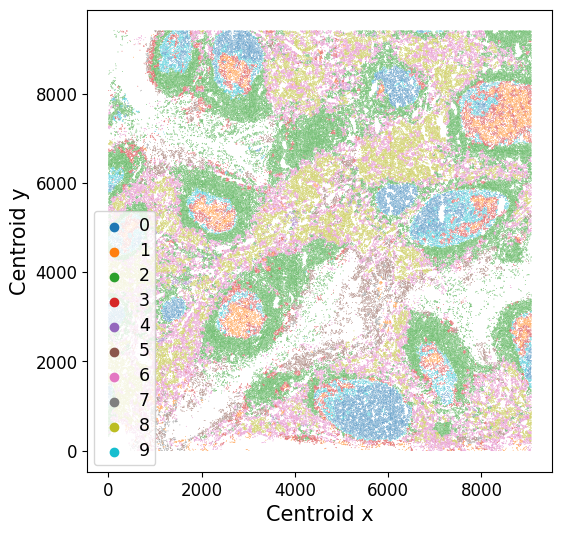

In [74]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_fsom_order", s = 0.3, rasterized=True)
               #hue_order = cell_type_order)#,
               #palette="muted")
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)
plt.savefig('figures_clustering/rna_fsom.png')
plt.savefig('figures_clustering/rna_fsom.svg', dpi=300)
plt.show()

In [81]:
protein_region = df
protein_patch = protein_region[
                (protein_region["centroid_x"] >= 1500) &#example_patch[0]) &
                (protein_region["centroid_x"] < 3700) & #example_patch[2]) &
                (protein_region["centroid_y"] >= 7200) &#example_patch[1]) &
                (protein_region["centroid_y"] < 9400) #example_patch[3])
            ]

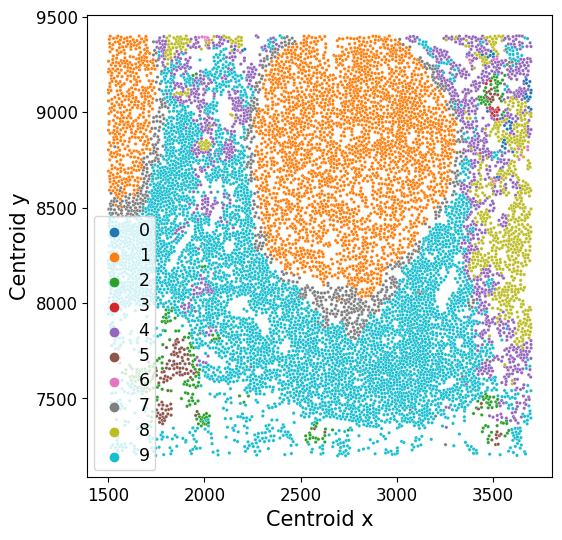

In [57]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_composition_fsom_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/cell_fsom_patch.png')
plt.savefig('figures_clustering/cell_fsom_patch.svg', dpi=300)
plt.show()

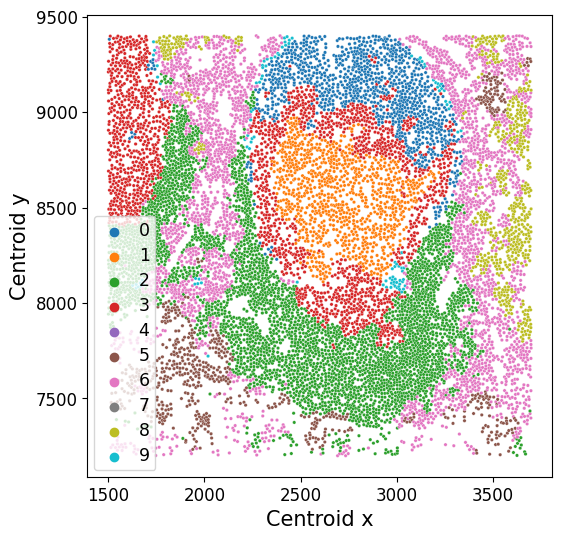

In [82]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_protein_fsom_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/protein_fsom_patch.png')
plt.savefig('figures_clustering/protein_fsom_patch.svg', dpi=300)
plt.show()

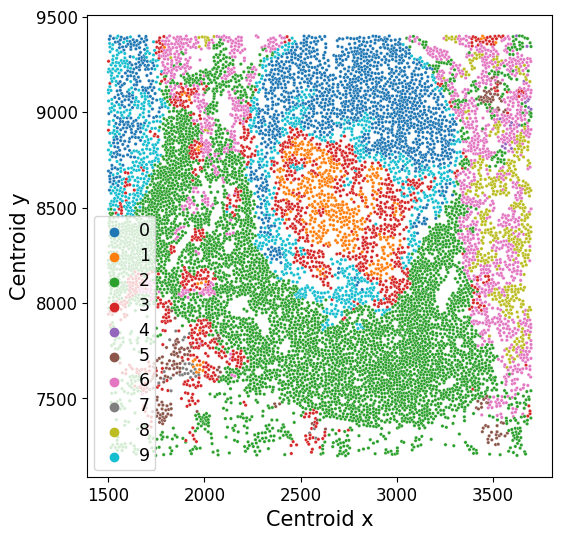

In [78]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=protein_patch, x="centroid_x", y="centroid_y", 
                hue="cluster_rna_fsom_order", 
                #hue_order=order_clusters_composition, 
                s =6, rasterized=True)#,
               #palette="muted")

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.xlabel("Centroid x", fontsize=15)
plt.ylabel("Centroid y", fontsize=15)

legend = plt.legend(title='', loc='lower left')
legend.get_title().set_fontsize('0') 
for label in legend.get_texts():
    label.set_fontsize(12.5)

plt.savefig('figures_clustering/rna_fsom_patch.png')
plt.savefig('figures_clustering/rna_fsom_patch.svg', dpi=300)
plt.show()

In [61]:
df['reg'] = '1'
custom_patch = [(1500,7200,3700,9400)]

In [62]:
patch_indices, patch_comp = calculate_diversity_index(spatial_data=df, 
                                                  library_key='reg', 
                                                  library_id='1', 
                                                  spatial_key=['centroid_x','centroid_y'], 
                                                  patches=custom_patch, 
                                                  cluster_key='cluster_composition_fsom_order', 
                                                  metric='Shannon Diversity', return_comp=True)
grid = diversity_heatmap(spatial_data=df,
                             library_key='reg',
                             library_id='1',
                             spatial_key=['centroid_x','centroid_y'],
                             patches=custom_patch, 
                             heterogeneity_indices=patch_indices,
                             plot=False)
print(grid)

NameError: name 'calculate_diversity_index' is not defined